In [ ]:
import os

# 1. The Installation
!pip uninstall -y numpy pandas ultralytics
!pip install "numpy<2.0" "pandas==2.2.2" "ultralytics" "opencv-python-headless<4.11" roboflow -q
!pip install lime 
!pip install grad-cam -q

# 2. The Auto-Restart
# This will crash the kernel intentionally to force a reload. 
# Don't worry about the "Session crashed" message; it's exactly what we want.
os._exit(00)

Found existing installation: numpy 1.26.4
Uninstalling numpy-1.26.4:
  Successfully uninstalled numpy-1.26.4
Found existing installation: pandas 2.2.3
Uninstalling pandas-2.2.3:
  Successfully uninstalled pandas-2.2.3
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 74.6 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 65.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 36.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 35.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 27.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 38.8 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━

In [1]:
import torch
import os 
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"
import cv2 
import yaml 
import glob 
import numpy as np 
import matplotlib.pyplot as plt 
import random

from ultralytics import YOLO
from PIL import Image
from roboflow import Roboflow
from torchvision import transforms

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [2]:
import random
import yaml
import pandas as pd
import datetime
import shutil
from pathlib import Path
from collections import Counter
from tqdm import tqdm
from sklearn.model_selection import KFold


# --- 1. CONFIGURATION & PATHS ---
random.seed(0) 
ksplit = 5
supported_extensions = [".jpg", ".jpeg", ".png"]

dataset_path = Path("/kaggle/input/birdnest-balanced-1-v11-nosplit/BirdNest Balanced-1-v11")
yaml_file = dataset_path / "data.yaml"
save_path = Path("/kaggle/working") / f"BirdNest-Balanced-{ksplit}Fold-Crossval"
save_path.mkdir(parents=True, exist_ok=True)


# --- 2. DATA SCANNING & FEATURE VECTORS ---
labels = sorted(dataset_path.rglob("*labels/*.txt"))
with open(yaml_file, encoding="utf8") as y:
    data_content = yaml.safe_load(y)
    classes = data_content["names"]

# Handle list vs dict format for class names
class_mapping = classes if isinstance(classes, dict) else {i: name for i, name in enumerate(classes)}
cls_idx = list(class_mapping.keys())

# Build the labels_df (Feature Vectors)
index = [label.stem for label in labels]
labels_df = pd.DataFrame(0.0, columns=cls_idx, index=index)

for label in tqdm(labels, desc="Scanning Labels"):
    with open(label) as lf:
        counts = Counter([int(line.split(" ", 1)[0]) for line in lf])
        for cid, count in counts.items():
            labels_df.at[label.stem, cid] = count


# --- 3. K-FOLD PARTITIONING ---
kf = KFold(n_splits=ksplit, shuffle=True, random_state=20)
kfolds = list(kf.split(labels_df))

folds = [f"split_{n}" for n in range(1, ksplit + 1)]
folds_df = pd.DataFrame(index=index, columns=folds)

# Map filenames to 'train' or 'val' for each split
for i, (train, val) in enumerate(kfolds, start=1):
    folds_df.loc[labels_df.iloc[train].index, f"split_{i}"] = "train"
    folds_df.loc[labels_df.iloc[val].index, f"split_{i}"] = "val"

# Calculate label distribution ratios (Research validation)
fold_lbl_distrb = pd.DataFrame(index=folds, columns=cls_idx)
for n, (train_idx, val_idx) in enumerate(kfolds, start=1):
    train_totals = labels_df.iloc[train_idx].sum()
    val_totals = labels_df.iloc[val_idx].sum()
    fold_lbl_distrb.loc[f"split_{n}"] = val_totals / (train_totals + 1e-7)


# --- 4. DIRECTORY & YAML CREATION ---
images = []
for ext in supported_extensions:
    images.extend(sorted((dataset_path / "images").rglob(f"*{ext}")))

ds_yamls = []
for split in folds_df.columns:
    split_dir = save_path / split
    for subset in ["train", "val"]:
        (split_dir / subset / "images").mkdir(parents=True, exist_ok=True)
        (split_dir / subset / "labels").mkdir(parents=True, exist_ok=True)

    dataset_yaml = split_dir / f"{split}_dataset.yaml"
    ds_yamls.append(dataset_yaml)
    with open(dataset_yaml, "w") as ds_y:
        yaml.safe_dump({
            "path": split_dir.as_posix(),
            "train": "train/images",
            "val": "val/images",
            "names": classes,
        }, ds_y)


# --- 5. FILE RELOCATION (Copying images and labels) ---
# Create a dictionary for faster lookups
label_dict = {lbl.stem: lbl for lbl in labels}

for image in tqdm(images, desc="Organizing Folds"):
    if image.stem in folds_df.index:
        label = label_dict.get(image.stem)
        for split in folds_df.columns:
            k_split = folds_df.at[image.stem, split] # 'train' or 'val'
            
            img_dest = save_path / split / k_split / "images" / image.name
            lbl_dest = save_path / split / k_split / "labels" / label.name
            
            shutil.copy(image, img_dest)
            shutil.copy(label, lbl_dest)


# --- 6. SAVE METADATA ---
folds_df.to_csv(save_path / "kfold_datasplit.csv")
fold_lbl_distrb.to_csv(save_path / "kfold_label_distribution.csv")

print(f"\n✅ SUCCESS: {ksplit}-Fold dataset created at {save_path}")
print(f"📊 Distribution check saved to kfold_label_distribution.csv")

Organizing Folds: 100%|██████████| 2451/2451 [00:38<00:00, 63.71it/s]


✅ SUCCESS: 5-Fold dataset created at /kaggle/working/BirdNest-Balanced-5Fold-Crossval
📊 Distribution check saved to kfold_label_distribution.csv


In [ ]:
from ultralytics import YOLO
import pandas as pd

# 1. Configuration
weights_path = "yolo11m.pt"
batch = 16
epochs = 50 
project = "BirdNest-Balanced-5Fold-Results"
results_dict = {}  # We use this to store the full metrics for Part 2
summary_list = []

# 2. K-Fold Training Loop
for k, dataset_yaml in enumerate(ds_yamls):
    fold_num = k + 1
    print(f"\n🚀 STARTING FOLD {fold_num}...")
    
    # Re-initialize model to COCO weights for each fold
    model = YOLO(weights_path) 
    
    # Train and capture the full Metrics object
    metrics = model.train(
        data=dataset_yaml, 
        epochs=epochs, 
        batch=batch, 
        project=project, 
        name=f"fold_{fold_num}",
        patience=10,
        verbose=False # Keeps logs clean
    )
    
    # Store the full object for the printing cell
    results_dict[f"Fold {fold_num}"] = metrics
    
    # Save the flat results for the CSV summary
    fold_results = metrics.results_dict
    fold_results['fold'] = fold_num
    summary_list.append(fold_results)

# 3. Save Summary for Research
final_df = pd.DataFrame(summary_list)
final_df.to_csv(f"/kaggle/working/{project}/kfold_final_metrics.csv", index=False)

print("\n✅ K-Fold Training Complete!")
print(f"📊 Summary of all 5 folds saved to /kaggle/working/{project}/kfold_final_metrics.csv")

In [ ]:
print("\n" + "="*30)
print("===== K-FOLD RESULTS =====")
print("="*30 + "\n")

# Iterating through the dictionary created in the training cell
for fold_label, res in results_dict.items():
    # 'res' is the Ultralytics Metrics object
    # We access the .box attributes for detection tasks
    print(f"📍 {fold_label}")
    print(f"  mAP50:      {res.box.map50:.4f}")
    print(f"  mAP50-95:   {res.box.map:.4f}")
    print(f"  Precision:  {res.box.mp:.4f}")
    print(f"  Recall:     {res.box.mr:.4f}")
    print("-" * 30)

# Final Overall Average for your Research Paper
if summary_list:
    avg_map5095 = pd.DataFrame(summary_list)['metrics/mAP50-95(B)'].mean()
    print(f"🏆 OVERALL MEAN mAP50-95: {avg_map5095:.4f}")

In [ ]:
rf = Roboflow(api_key="sNwZKFyXE0vHSdAqPXX0")
project = rf.workspace("main-workspace-vcien").project("birdnest-balanced")
version = project.version(1)
dataset = version.download("yolov11")

In [ ]:
for i in range(ksplit): 
    path = f"/kaggle/working/BirdNest-Balanced-5Fold-Results/fold_{i+1}/weights/best.pt"
    loaded_model = YOLO(path)
    
    metrics = loaded_model.val(data="BirdNest-Balanced-1/data.yaml", split="test", plots=True)

    precision = metrics.results_dict["metrics/precision(B)"]
    recall = metrics.results_dict["metrics/recall(B)"]
    mAP = metrics.results_dict["metrics/mAP50-95(B)"]

    print(f"========== Model for Fold {i+1} ==========")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"mAP: {mAP}\n")

In [ ]:
import shutil
import os
from IPython.display import FileLink, display

# 1. Define the directory you want to download
folder_to_zip = "BirdNest-Balanced-5Fold-Results"
output_filename = "BirdNest-Balanced-5Fold-Results"

# 2. Check if folder exists
if os.path.exists(folder_to_zip):
    print(f"Zipping folder: {folder_to_zip}...")

    # Create zip archive (preserves folder structure)
    shutil.make_archive(
        output_filename,
        "zip",
        root_dir=".",
        base_dir=folder_to_zip
    )

    print(f"✅ Success! Created {output_filename}.zip")
    print("Click the link below to download everything:")

    # 3. Generate clickable download link
    display(FileLink(f"{output_filename}.zip"))

else:
    print(f"❌ Error: Folder '{folder_to_zip}' not found. Did the training finish correctly?")


# LIME Implementation

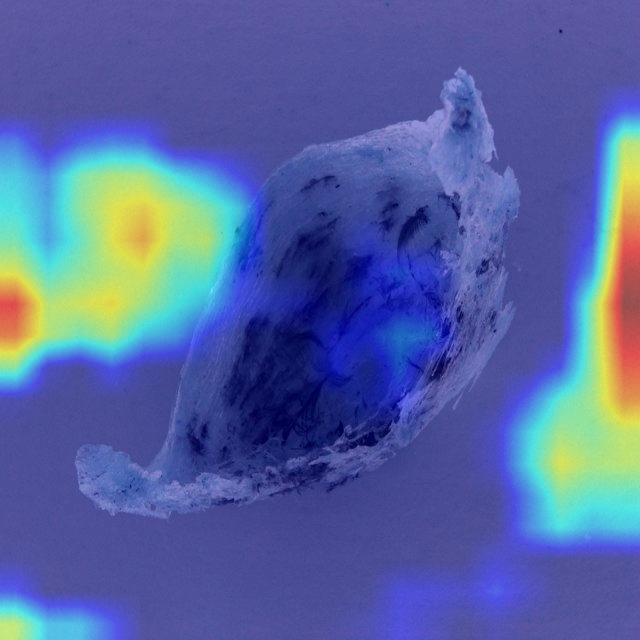

In [15]:
import cv2
import torch
import numpy as np
from PIL import Image
from ultralytics import YOLO
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

# 1. SETUP & MODEL LOADING
torch.set_grad_enabled(True) 
model = YOLO("/kaggle/input/yolo11s-50-5fold2/pytorch/default/1/best.pt")

# 2. ROBUST WRAPPER
class YOLOv11Wrapper(torch.nn.Module):
    def __init__(self, model):
        super().__init__()
        self.raw_model = model.model
        
    def forward(self, x):
        # YOLO forward pass often returns [logits_tensor, extra_info]
        logits = self.raw_model(x)
        if isinstance(logits, (list, tuple)):
            logits = logits[0]
        return logits.squeeze(0) 

wrapped_model = YOLOv11Wrapper(model)
wrapped_model.eval()

# SPPF layer for global feature context
target_layers = [model.model.model[10]] 

# 3. PREPARE THE INPUT
img_path = "/kaggle/input/birdnest-balanced-1-v11-nosplit/BirdNest Balanced-1-v11/images/SizeA-15-_bmp_jpg.rf.200f933fa64dc9a59199928d87a7e982.jpg"
img = cv2.imread(img_path)
img = cv2.resize(img, (640, 640))
rgb_img = np.float32(img) / 255

input_tensor = torch.from_numpy(np.transpose(rgb_img, (2, 0, 1))).unsqueeze(0).to(torch.float32)
input_tensor.requires_grad = True 

# 4. EXECUTE GRAD-CAM
targets = [ClassifierOutputTarget(0)] # Target Grade A
cam = GradCAM(model=wrapped_model, target_layers=target_layers)

grayscale_cam = cam(input_tensor=input_tensor, targets=targets)
grayscale_cam = grayscale_cam[0, :]

# 5. VISUALIZATION
visualization = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)
display(Image.fromarray(visualization))

In [ ]:
loaded_model = YOLO("/kaggle/input/yolo11s-50-5fold2/pytorch/default/1/best.pt")

In [ ]:
IMG_DIR = "/kaggle/input/birdnest-balanced-1-v11-nosplit/BirdNest Balanced-1-v11/images/SizeA-15-_bmp_jpg.rf.200f933fa64dc9a59199928d87a7e982.jpg"
img = Image.open(IMG_DIR)

plt.figure(figsize=(5, 5))
plt.imshow(img)
plt.axis("off")
plt.show()

In [3]:
print("hello")

hello


In [4]:
files = [f for f in os.listdir("/kaggle/input/birdnest-balanced-1-v11-nosplit/BirdNest Balanced-1-v11/images/") if f.startswith("SizeA-15")]

print(files)

['SizeA-15-_bmp_jpg.rf.e43f397660be034cbffdcf3de21735bc.jpg', 'SizeA-15-_bmp_jpg.rf.87674b764df7eca2b98e7b3202b13228.jpg', 'SizeA-15-_bmp.rf.6d133ab2e7755ff8cdaea0027703a456.jpg', 'SizeA-15-_bmp.rf.467a6f3bac3e6900424574f4ad698865.jpg', 'SizeA-15-_bmp_jpg.rf.32aa652ae096fad3bdad54023d0b9387.jpg', 'SizeA-15-_bmp_jpg.rf.200f933fa64dc9a59199928d87a7e982.jpg', 'SizeA-15-_bmp_jpg.rf.4e0e56855e23f8753089aad3d47a2501.jpg', 'SizeA-15-_bmp.rf.63d53b56b43c9eb1fdfdfe3387657672.jpg', 'SizeA-15-_bmp_jpg.rf.9086b5a96f06749cf721fd0d5063276b.jpg']


# Model Load & Sobel

In [5]:
loaded_model = YOLO("/kaggle/input/yolo11s-50-5fold2/pytorch/default/1/best.pt")

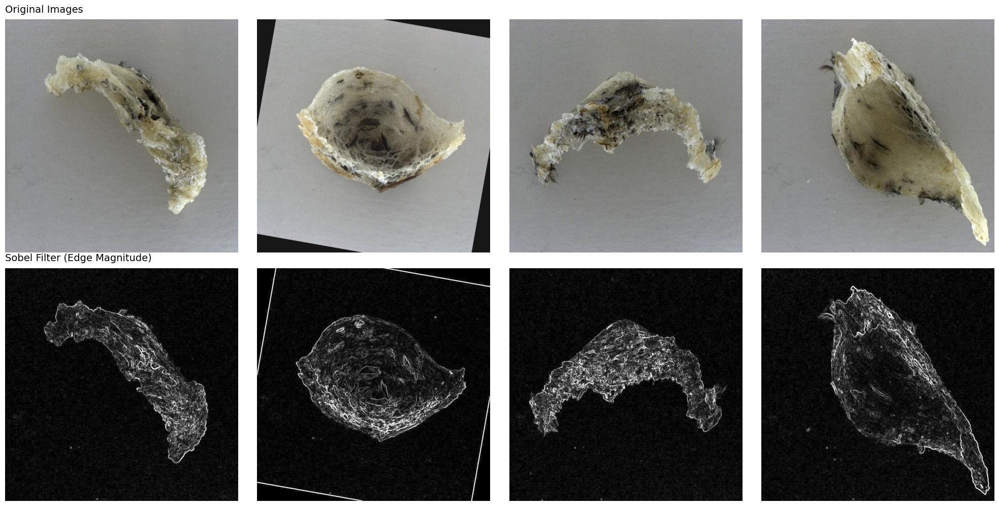

In [6]:
# --- Paths ---
DATASET_ROOT = "/kaggle/input/birdnest-balanced-1-v11-nosplit/BirdNest Balanced-1-v11"
IMG_DIR = os.path.join(DATASET_ROOT, "images")

# 1. Find and Sample 4 images
image_extensions = ("*.jpg", "*.jpeg", "*.png")
all_image_paths = []
for ext in image_extensions:
    all_image_paths.extend(glob.glob(os.path.join(IMG_DIR, ext)))

if len(all_image_paths) < 4:
    print(f"Error: Found only {len(all_image_paths)} images. Need at least 4.")
else:
    sampled_paths = random.sample(all_image_paths, 4)

    # 2. Setup Plotting Grid (2 Rows, 4 Columns)
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))
    
    for i, img_path in enumerate(sampled_paths):
        # Read and convert colors
        img_bgr = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
        
        # --- 3. Apply Sobel Filter ---
        # Calculate gradients in x and y directions
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3) # Horizontal edges
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3) # Vertical edges
        
        # Calculate the magnitude (combine x and y)
        sobel_combined = cv2.magnitude(sobelx, sobely)
        
        # Convert back to 8-bit image for display
        sobel_8bit = cv2.convertScaleAbs(sobel_combined)
        
        # --- Display Top Row (Original) ---
        ax_orig = axes[0, i]
        ax_orig.imshow(img_rgb)
        ax_orig.axis('off')
        
        # --- Display Bottom Row (Sobel) ---
        ax_sobel = axes[1, i]
        ax_sobel.imshow(sobel_8bit, cmap='gray')
        ax_sobel.axis('off')

    # Row Titles
    axes[0,0].set_title("Original Images", loc='left', fontsize=14, pad=10)
    axes[1,0].set_title("Sobel Filter (Edge Magnitude)", loc='left', fontsize=14, pad=10)
        
    plt.tight_layout()
    plt.show()

# Model Evaluation

In [7]:
MODEL_PATH = "/kaggle/input/yolo11s-50-5fold2/pytorch/default/1/best.pt"  
DATASET_ROOT = "/kaggle/input/birdnest-balanced-1-v11-nosplit/BirdNest Balanced-1-v11"                   

DATA_YAML_PATH = os.path.join(DATASET_ROOT, "data.yaml")
IMG_DIR = os.path.join(DATASET_ROOT, "images")
LABEL_DIR = os.path.join(DATASET_ROOT, "labels")

NUM_IMAGES = 64
CONF_THRESHOLD = 0.25  # Only show predictions above this confidence
GT_COLOR = (0, 255, 0)  # Green for Ground Truth
PRED_COLOR = (0, 0, 255) # Red for Prediction
TEXT_SCALE = 0.6
TEXT_THICKNESS = 1
BOX_THICKNESS = 2

In [8]:
def load_config(yaml_path):
    """Loads the dataset's data.yaml file."""
    try:
        with open(yaml_path, 'r') as f:
            config = yaml.safe_load(f)
        return config['names']
    except Exception as e:
        print(f"Error loading {yaml_path}: {e}")
        print("Falling back to default class names: [Class 0, Class 1, Class 2...]")
        # Fallback in case YAML fails
        return [f"Class {i}" for i in range(3)] # Assuming 3 classes as per your prompt

def parse_ground_truth(label_path, img_shape):
    """Reads a YOLO .txt label file and converts it to absolute xyxy coordinates."""
    gts = []
    if not os.path.exists(label_path):
        return gts  # Return empty list for background images

    h, w = img_shape[:2]
    try:
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) != 5:
                    continue
                
                class_id, x_c, y_c, w_norm, h_norm = map(float, parts)
                
                # Convert from normalized xywh to absolute xyxy
                box_w = w_norm * w
                box_h = h_norm * h
                x1 = int((x_c * w) - (box_w / 2))
                y1 = int((y_c * h) - (box_h / 2))
                x2 = int(x1 + box_w)
                y2 = int(y1 + box_h)
                
                gts.append([x1, y1, x2, y2, int(class_id)])
    except Exception as e:
        print(f"Error parsing {label_path}: {e}")
    return gts

def draw_boxes_clean(image, gts, preds, class_names):
    """Draws boxes. Predictions only show the class name and conf on the box."""
    vis_image = image.copy()

    # 1. Draw Ground Truth (Green)
    for gt in gts:
        x1, y1, x2, y2, class_id = gt
        label = f"GT: {class_names[class_id]}"
        cv2.rectangle(vis_image, (x1, y1), (x2, y2), GT_COLOR, BOX_THICKNESS)
        (w, h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        cv2.rectangle(vis_image, (x2 - w, y2 - h - 5), (x2, y2), GT_COLOR, -1)
        cv2.putText(vis_image, label, (x2 - w + 2, y2 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)

    # 2. Draw Prediction (Red)
    for box in preds.boxes:
        if box.conf[0] < CONF_THRESHOLD:
            continue
        x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())
        conf = float(box.conf[0].cpu().numpy())
        class_id = int(box.cls[0].cpu().numpy())
        
        # Label on box: Just "Pred: Class (0.xx)"
        label = f"{class_names[class_id]} ({conf:.2f})"
        
        cv2.rectangle(vis_image, (x1, y1), (x2, y2), PRED_COLOR, BOX_THICKNESS)
        (w, h), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        cv2.rectangle(vis_image, (x1, y1), (x1 + w, y1 + h + 5), PRED_COLOR, -1)
        cv2.putText(vis_image, label, (x1 + 2, y1 + h + 2), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
        
    return vis_image

Loading model from /kaggle/input/yolo11s-50-5fold2/pytorch/default/1/best.pt...
Loading class names from /kaggle/input/birdnest-balanced-1-v11-nosplit/BirdNest Balanced-1-v11/data.yaml...
Finding test images in /kaggle/input/birdnest-balanced-1-v11-nosplit/BirdNest Balanced-1-v11/images...
Found 2451 images. Randomly sampling 64...
Running predictions and generating grid... This may take a moment.
Grid generation complete. Displaying plot...


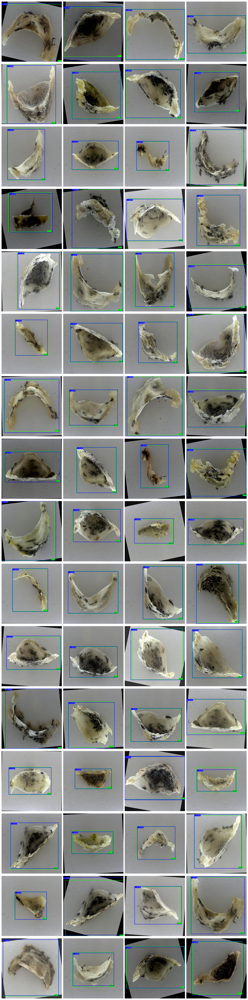

In [9]:
print(f"Loading model from {MODEL_PATH}...")
model = YOLO(MODEL_PATH)

print(f"Loading class names from {DATA_YAML_PATH}...")
class_names = load_config(DATA_YAML_PATH)

print(f"Finding test images in {IMG_DIR}...")
# Find all common image formats
image_patterns = [os.path.join(IMG_DIR, ext) for ext in ("*.jpg", "*.jpeg", "*.png")]
all_image_paths = []
for pattern in image_patterns:
    all_image_paths.extend(glob.glob(pattern))
    
if not all_image_paths:
    print(f"Error: No images found in {IMG_DIR}. Please check your paths.")
else:
    # Sample images
    num_to_sample = min(NUM_IMAGES, len(all_image_paths))
    print(f"Found {len(all_image_paths)} images. Randomly sampling {num_to_sample}...")
    sampled_image_paths = random.sample(all_image_paths, num_to_sample)
    
    # --- MODIFICATION: Create the grid for plotting (16 rows, 4 columns) ---
    num_cols = 4
    num_rows = int(np.ceil(num_to_sample / num_cols))
    
    fig_w = num_cols * 4  # 4 inches per image width
    fig_h = num_rows * 4  # 4 inches per image height
    
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(fig_w, fig_h))
    axes = axes.flatten() # Keep flattening to easily iterate
    # --- END MODIFICATION ---
    
    print("Running predictions and generating grid... This may take a moment.")
    
    for i, img_path in enumerate(sampled_image_paths):
        ax = axes[i]
        
        # Read image
        img_bgr = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
        
        # --- 1. Get Ground Truth ---
        label_name = os.path.basename(img_path)
        label_name = os.path.splitext(label_name)[0] + ".txt"
        label_path = os.path.join(LABEL_DIR, label_name)
        gts = parse_ground_truth(label_path, img_rgb.shape)
        
        # --- 2. Get Predictions ---
        # Run model on the BGR image (YOLO handles BGR/RGB)
        results = model(img_bgr, verbose=False, conf=CONF_THRESHOLD)
        preds = results[0] # Results for the first image
        
        # --- 3. Draw and Plot ---
        vis_image = draw_boxes_clean(img_rgb, gts, preds, class_names)
        
        ax.imshow(vis_image)
        ax.axis('off')
        
        # --- MODIFICATION: Removed the title ---
        # ax.set_title(os.path.basename(img_path), fontsize=10) # <-- This line is removed

    # Turn off any unused axes in the grid
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
        
    plt.tight_layout()
    print("Grid generation complete. Displaying plot...")
    plt.show()
    
    # Save the figure
    output_filename = "predictions_grid.png"
    fig.savefig(output_filename)

In [10]:
print("Hello")

Hello
